In [162]:
import numpy as np
import pandas as pd 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
import seaborn as sb
from kmodes.kmodes import KModes
from fcmeans import FCM
pd.set_option('display.max_rows', 4000000)
from scipy import stats
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.cluster import rand_score
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
import gower
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
from mlxtend.preprocessing import standardize
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from scipy import stats
from sklearn import metrics

In [163]:
df = pd.read_csv('C:/Users/asady/OneDrive - polymtl.ca/Data/Resource/Material/Raw Data/Weather/Hourly2020.csv', sep=";")
#df.set_index("date_time_local", inplace=True)
df.sort_values(by="date_time_local", ascending= False)
df

,date_time_local,pressure_station,pressure_sea,wind_dir,wind_dir_10s,wind_speed,relative_humidity,dew_point,temperature,visibility,max_air_temp_pst1hr,min_air_temp_pst1hr
0,2020-12-31 23:00:00 EST,102.57,103.01,WSW,25,8,79,-9.8,-6.7,24100,-4.10,-6.10
1,2020-12-31 22:00:00 EST,102.47,102.91,W,26,8,74,-9.1,-5.1,24100,-4.00,-5.20
2,2020-12-31 21:00:00 EST,102.36,102.80,WSW,25,5,72,-8.9,-4.6,24100,-3.90,-5.30
3,2020-12-31 20:00:00 EST,102.28,102.71,NW,30,11,65,-9.0,-3.3,24100,-3.30,-4.20
4,2020-12-31 19:00:00 EST,102.17,102.60,NW,31,16,63,-9.1,-3.0,24100,-2.70,-3.70
5,2020-12-31 18:00:00 EST,102.08,102.51,NW,31,15,62,-9.1,-2.8,24100,-2.40,-3.20
6,2020-12-31 17:00:00 EST,101.96,102.39,WNW,29,14,64,-8.4,-2.4,24100,-1.20,-2.60
7,2020-12-31 16:00:00 EST,101.85,102.28,WNW,29,27,61,-7.9,-1.3,48300,0.10,-1.50
8,2020-12-31 15:00:00 EST,101.69,102.12,WNW,30,24,57,-7.3,0.2,48300,0.60,0.00
9,2020-12-31 14:00:00 EST,101.53,101.96,WNW,28,21,58,-6.8,0.6,48300,0.60,0.30


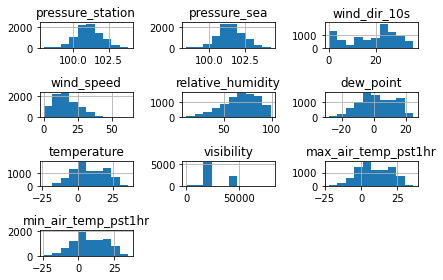

In [38]:
df.hist()
plt.tight_layout()

In [39]:
df.skew()

C:\Users\asady\AppData\Local\Temp/ipykernel_18280/1665899112.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



pressure_station       0.049103
pressure_sea           0.064813
wind_dir_10s          -0.403134
wind_speed             0.719684
relative_humidity     -0.442245
dew_point             -0.093324
temperature           -0.024022
visibility             0.439225
max_air_temp_pst1hr   -0.022404
min_air_temp_pst1hr   -0.035984
dtype: float64

In [173]:
df = df[['pressure_station', 'pressure_sea', 'wind_dir_10s', 'wind_speed', 'relative_humidity', 'dew_point', 'temperature', 'visibility', 'max_air_temp_pst1hr','min_air_temp_pst1hr']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pressure_station     8784 non-null   float64
 1   pressure_sea         8784 non-null   float64
 2   wind_dir_10s         8784 non-null   int64  
 3   wind_speed           8784 non-null   int64  
 4   relative_humidity    8784 non-null   int64  
 5   dew_point            8784 non-null   float64
 6   temperature          8784 non-null   float64
 7   visibility           8784 non-null   int64  
 8   max_air_temp_pst1hr  8784 non-null   float64
 9   min_air_temp_pst1hr  8784 non-null   float64
dtypes: float64(6), int64(4)
memory usage: 686.4 KB


Initialization complete
Iteration 0, inertia 4638620483053.231.
Iteration 1, inertia 1424591504277.627.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 237612789650.4683
Iteration 1, inertia 208370029087.50806
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 35538491517.29039
Iteration 1, inertia 32093734846.577454
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 18575088546.532143
Iteration 1, inertia 16296845544.366058
Converged at iteration 1: strict convergence.


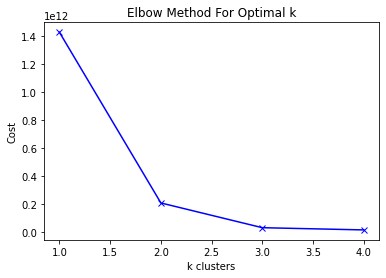

In [45]:
###################################### Elbow method########################################################
cost = []
K = range(1,5)
for num_clusters in list(K):
    model = KMeans(n_clusters=num_clusters, init = 'k-means++', n_init = 1, verbose=1)
    model.fit_predict(df)
    cost.append(model.inertia_)
    
plt.plot(K, cost, 'bx-')
plt.xlabel('k clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

C:\Users\asady\.conda\envs\Gower\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='count'>

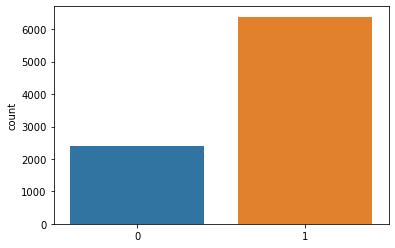

In [49]:

model = KMeans(n_clusters = 2, init = "k-means++", max_iter = 300, n_init = 10, random_state = 0)
label = model.fit_predict(df)
sns.countplot(label)

For n_clusters = 2 The average silhouette_score is : 0.9040429114141191
For n_clusters = 3 The average silhouette_score is : 0.9380699567676772
For n_clusters = 4 The average silhouette_score is : 0.9385629170274675
For n_clusters = 5 The average silhouette_score is : 0.9397973800519845
For n_clusters = 6 The average silhouette_score is : 0.9523921034862267
For n_clusters = 7 The average silhouette_score is : 0.952565971218331
For n_clusters = 8 The average silhouette_score is : 0.9562400032137568
For n_clusters = 9 The average silhouette_score is : 0.9671471889749446
For n_clusters = 10 The average silhouette_score is : 0.9674748945217717
For n_clusters = 11 The average silhouette_score is : 0.9676328435298288
For n_clusters = 12 The average silhouette_score is : 0.9676886780320328
For n_clusters = 13 The average silhouette_score is : 0.9694157524349781
For n_clusters = 14 The average silhouette_score is : 0.9747502784426428
For n_clusters = 15 The average silhouette_score is : 0.9754

C:\Users\asady\AppData\Local\Temp/ipykernel_18280/3152140183.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



For n_clusters = 22 The average silhouette_score is : 0.9762526739657331
For n_clusters = 23 The average silhouette_score is : 0.9743461030313126
For n_clusters = 24 The average silhouette_score is : 0.9765869014256923
For n_clusters = 25 The average silhouette_score is : 0.5913081872083379
For n_clusters = 26 The average silhouette_score is : 0.5928944549334022
For n_clusters = 27 The average silhouette_score is : 0.5936538166226323
For n_clusters = 28 The average silhouette_score is : 0.4111166044340022
For n_clusters = 29 The average silhouette_score is : 0.3789627470803128


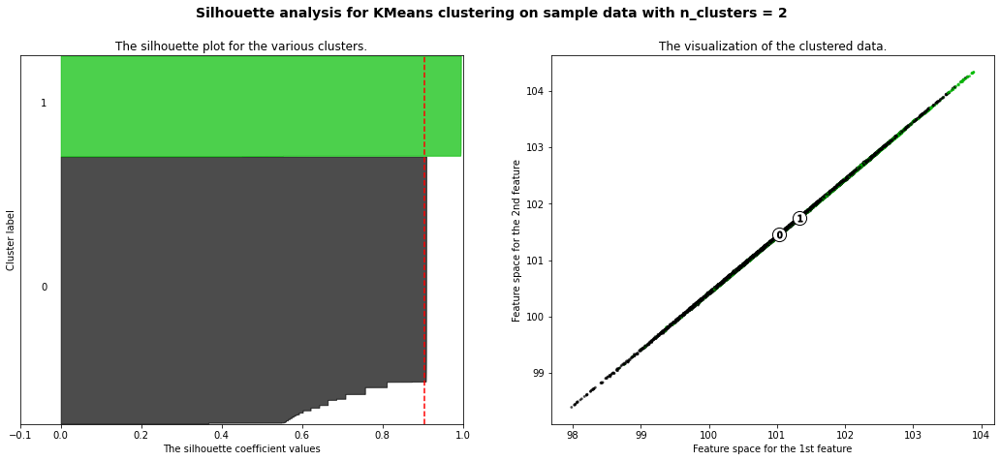

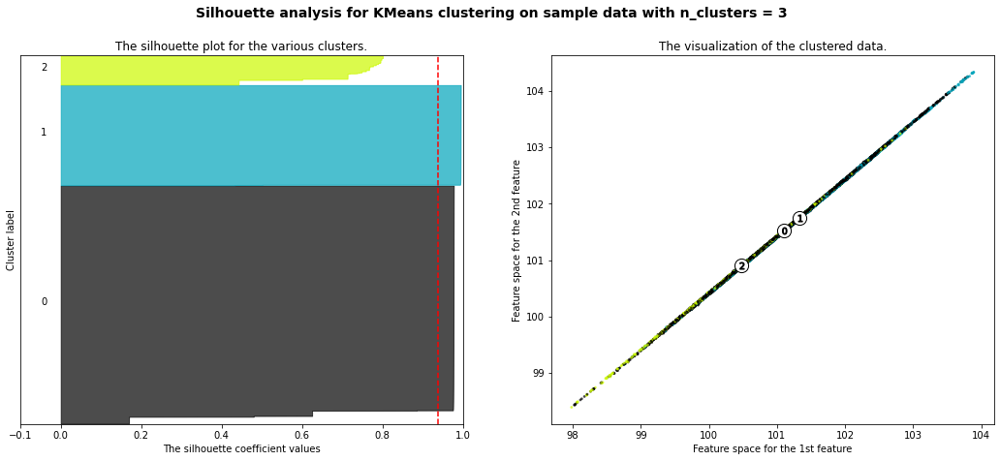

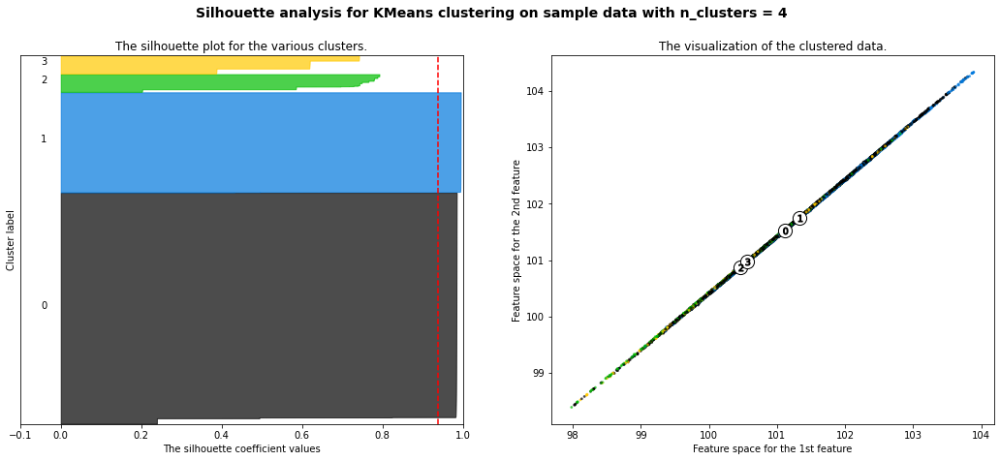

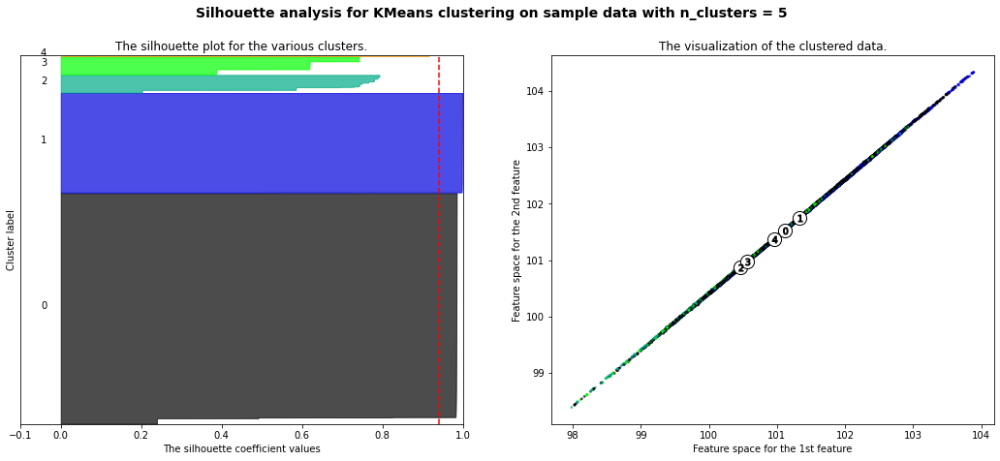

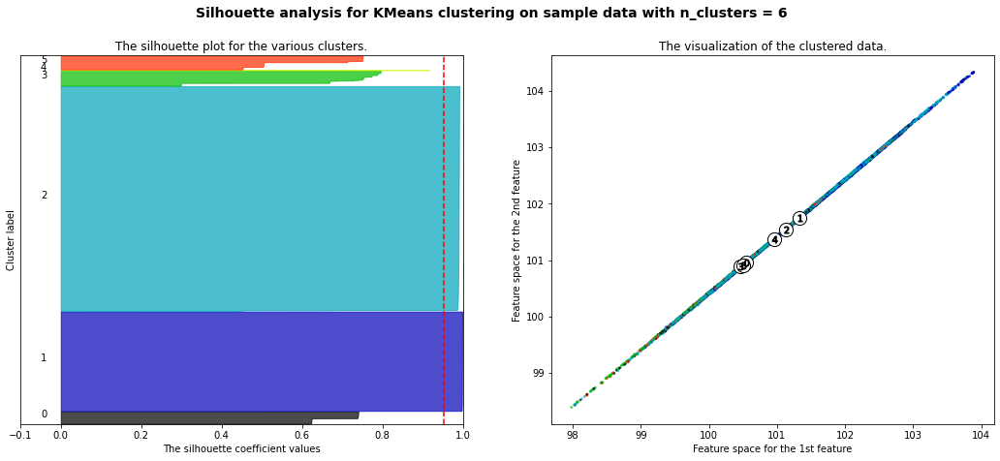

...

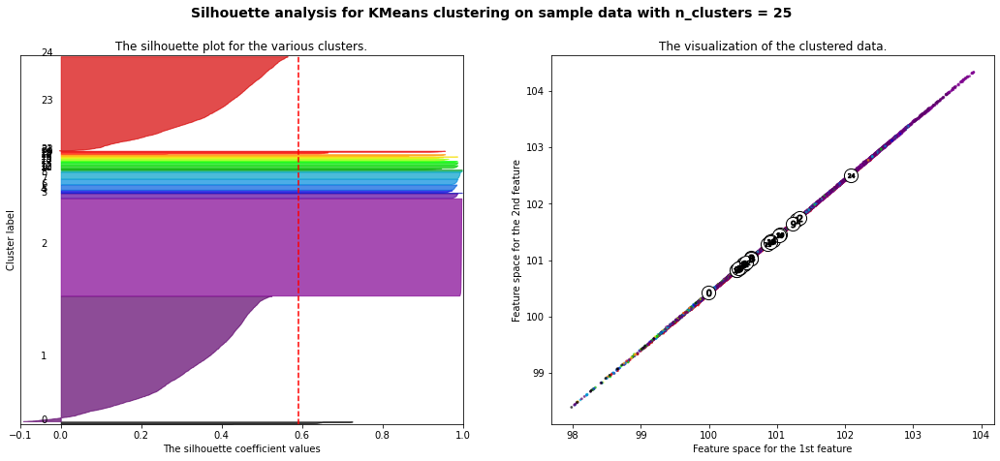

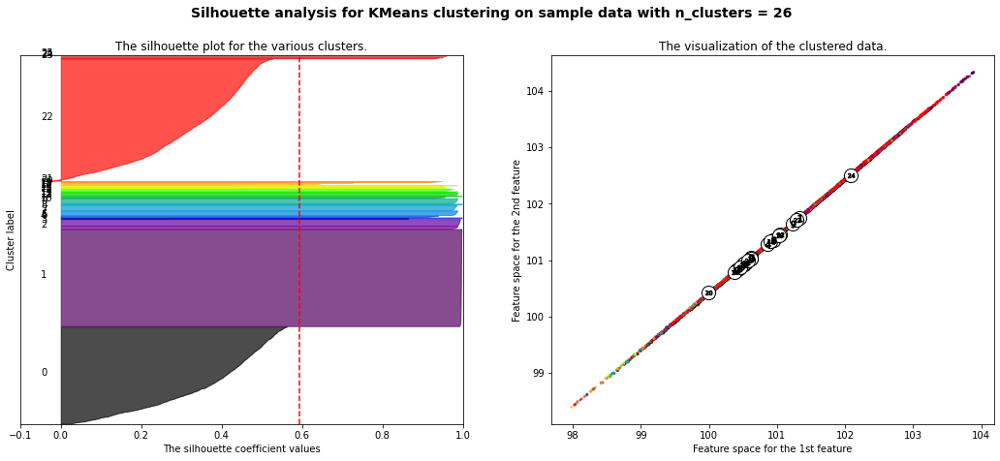

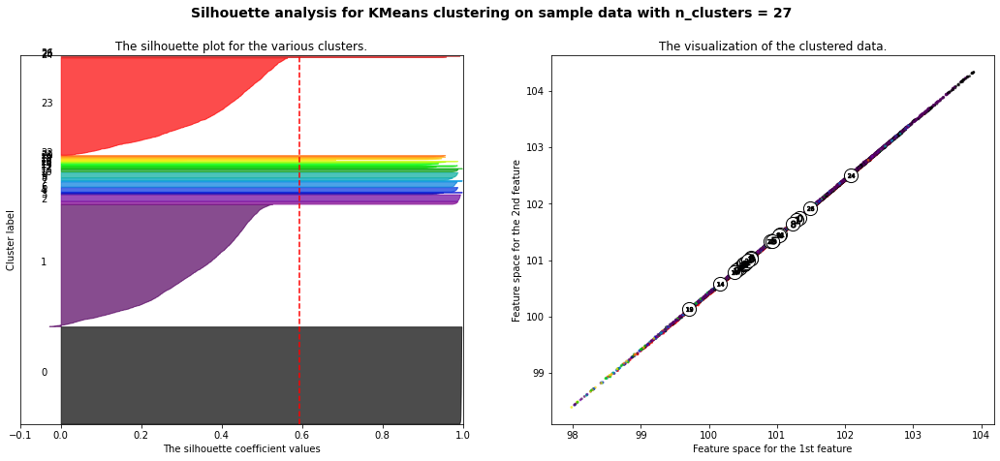

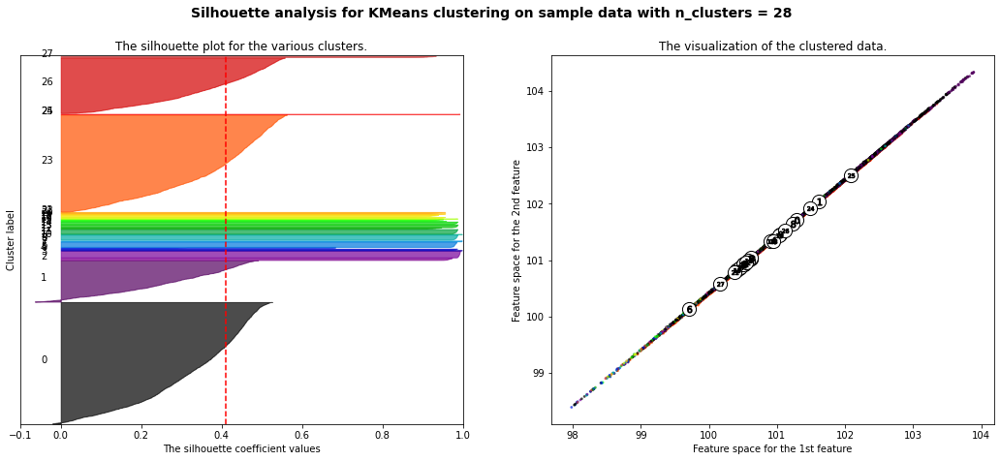

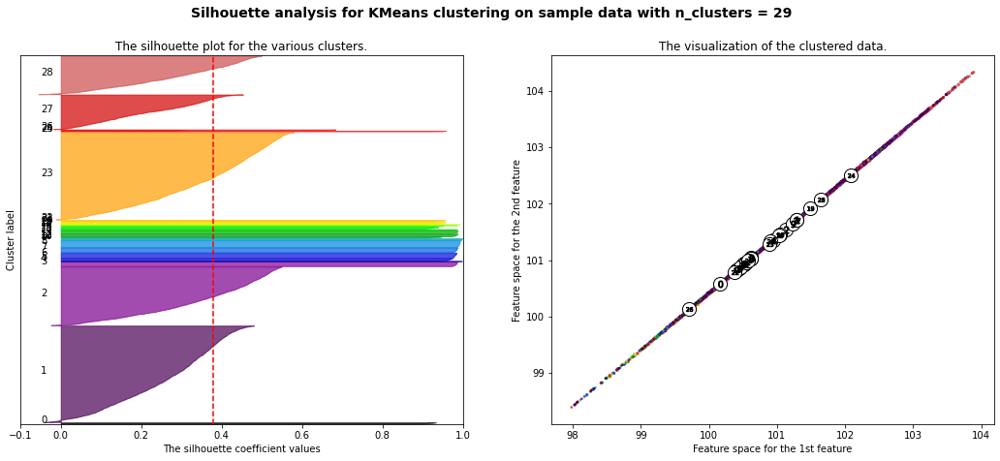

In [53]:
for n_clusters in range(2,30):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df.iloc[:, 0], df.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [177]:
##################################### k-means #####################################################
cluster = KMeans(n_clusters=18)
cluster_labels = cluster.fit(df)
df['labels'] = cluster.predict(df)

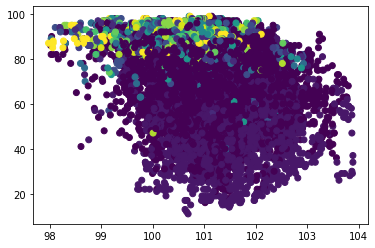

,count,mean,std,min,25%,50%,75%,max
pressure_station,2387.0,101.329853,0.846525,98.68,100.70,101.29,101.90,103.89
pressure_sea,2387.0,101.742442,0.855736,99.08,101.10,101.70,102.31,104.33
wind_dir_10s,2387.0,19.586091,9.275405,0.00,14.00,22.00,26.00,36.00
wind_speed,2387.0,17.280687,8.755502,1.00,11.00,16.00,23.00,56.00
relative_humidity,2387.0,52.276079,16.370310,11.00,41.00,52.00,63.00,95.00
dew_point,2387.0,2.437872,11.025112,-27.20,-5.70,3.40,11.70,22.90
temperature,2387.0,12.683661,11.330051,-20.80,4.85,14.10,21.75,34.70
visibility,2387.0,48300.000000,0.000000,48300.00,48300.00,48300.00,48300.00,48300.00
max_air_temp_pst1hr,2387.0,13.171219,11.346872,-20.60,5.40,14.60,22.30,34.80
min_air_temp_pst1hr,2387.0,11.858735,11.263941,-23.70,4.25,13.20,20.70,33.60


In [178]:
######################################################## Clustering analysis #################################################
plt.scatter(df['pressure_station'], df['relative_humidity'], c=labels)
plt.show()

dg = df[df['labels']==0]
dg.describe().transpose()

In [172]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
pressure_station,8784.0,101.114531,0.895297,97.98,100.54,101.07,101.66,103.89
pressure_sea,8784.0,101.529115,0.903637,98.39,100.95,101.48,102.08,104.33
wind_dir_10s,8784.0,18.565232,10.204929,0.00,11.00,22.00,26.00,36.00
wind_speed,8784.0,16.363046,9.004352,0.00,9.00,15.00,22.00,62.00
relative_humidity,8784.0,67.136043,18.016117,11.00,55.00,69.00,81.00,99.00
dew_point,8784.0,2.134062,10.872988,-27.90,-5.70,1.10,11.30,24.90
temperature,8784.0,8.493021,11.401501,-23.70,0.10,7.60,18.30,35.80
visibility,8784.0,29171.618852,12735.686867,200.00,24100.00,24100.00,48300.00,80500.00
max_air_temp_pst1hr,8784.0,9.146480,11.413883,-22.20,0.70,8.30,19.00,36.10
min_air_temp_pst1hr,8784.0,8.076006,11.260201,-24.10,0.00,7.10,17.80,34.90


In [180]:
df.compare(dg)

ValueError: Can only compare identically-labeled DataFrame objects

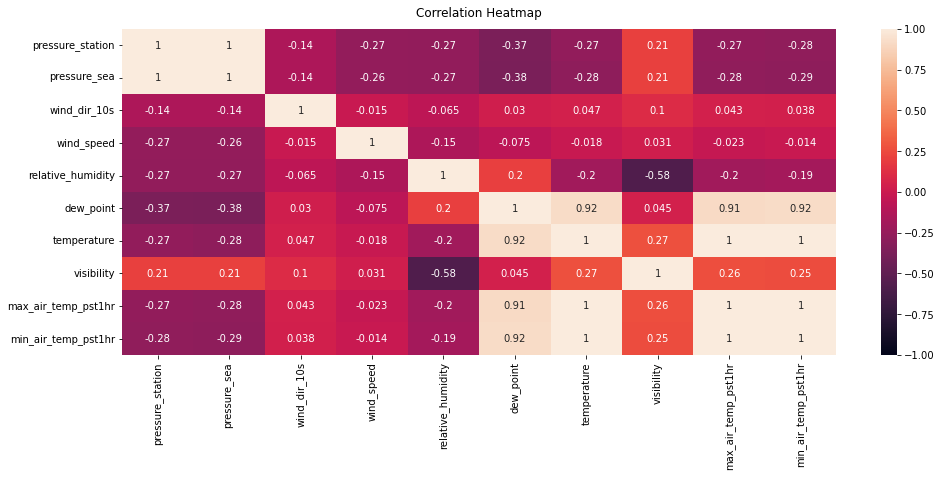

In [68]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [69]:
df.columns

Index(['pressure_station', 'pressure_sea', 'wind_dir_10s', 'wind_speed',
       'relative_humidity', 'dew_point', 'temperature', 'visibility',
       'max_air_temp_pst1hr', 'min_air_temp_pst1hr'],
      dtype='object')

In [70]:
del df['pressure_sea']
del df['dew_point']
del df['max_air_temp_pst1hr']
del df['min_air_temp_pst1hr']

In [94]:
X = StandardScaler().fit_transform(df)
Y = MinMaxScaler().fit_transform(df)

In [72]:
df

,pressure_station,wind_dir_10s,wind_speed,relative_humidity,temperature,visibility
0,102.57,25,8,79,-6.7,24100
1,102.47,26,8,74,-5.1,24100
2,102.36,25,5,72,-4.6,24100
3,102.28,30,11,65,-3.3,24100
4,102.17,31,16,63,-3.0,24100
5,102.08,31,15,62,-2.8,24100
6,101.96,29,14,64,-2.4,24100
7,101.85,29,27,61,-1.3,48300
8,101.69,30,24,57,0.2,48300
9,101.53,28,21,58,0.6,48300


In [87]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

AttributeError: 'numpy.ndarray' object has no attribute 'corr'

<Figure size 1152x432 with 0 Axes>

In [103]:
model = KMeans(n_clusters=18)
model.fit(Y)
labels = model.predict(Y)

#plt.scatter(X['pressure_station'], df['relative_humidity'], c=labels)
#plt.show()

C:\Users\asady\.conda\envs\Gower\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:ylabel='count'>

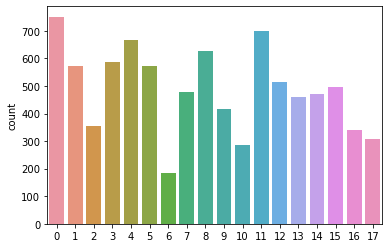

In [104]:
sns.countplot(labels)

For n_clusters = 2 The average silhouette_score is : 0.2565455210333167
For n_clusters = 3 The average silhouette_score is : 0.260096443312209
For n_clusters = 4 The average silhouette_score is : 0.2317604985131288
For n_clusters = 5 The average silhouette_score is : 0.21359165237598407
For n_clusters = 6 The average silhouette_score is : 0.1995632379076914
For n_clusters = 7 The average silhouette_score is : 0.19078130046733158
For n_clusters = 8 The average silhouette_score is : 0.1981583171240006
For n_clusters = 9 The average silhouette_score is : 0.1998353498493669


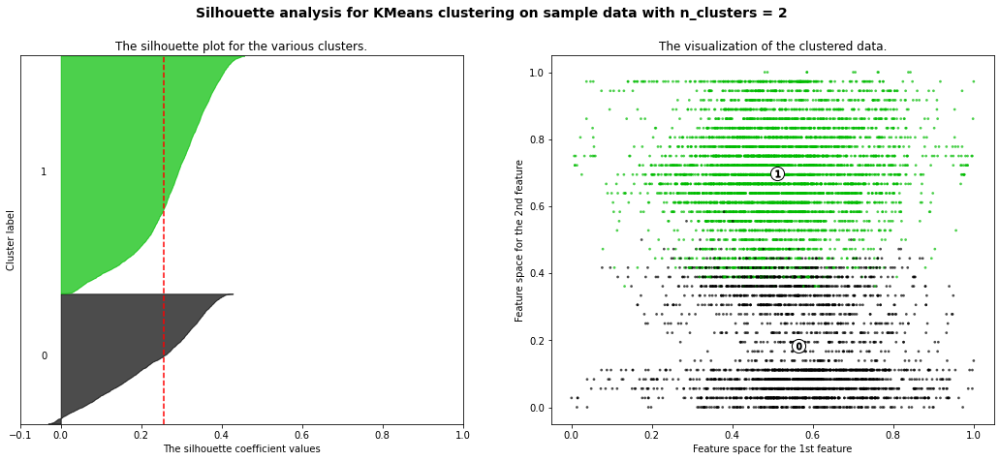

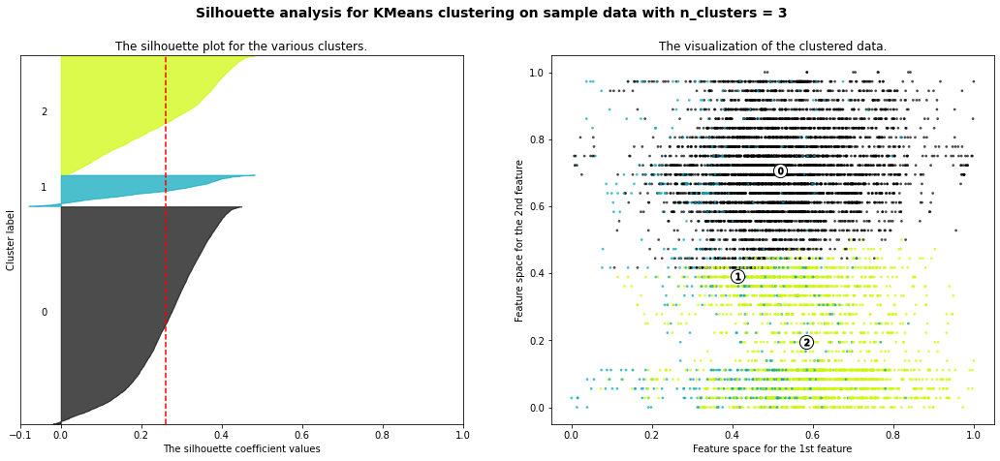

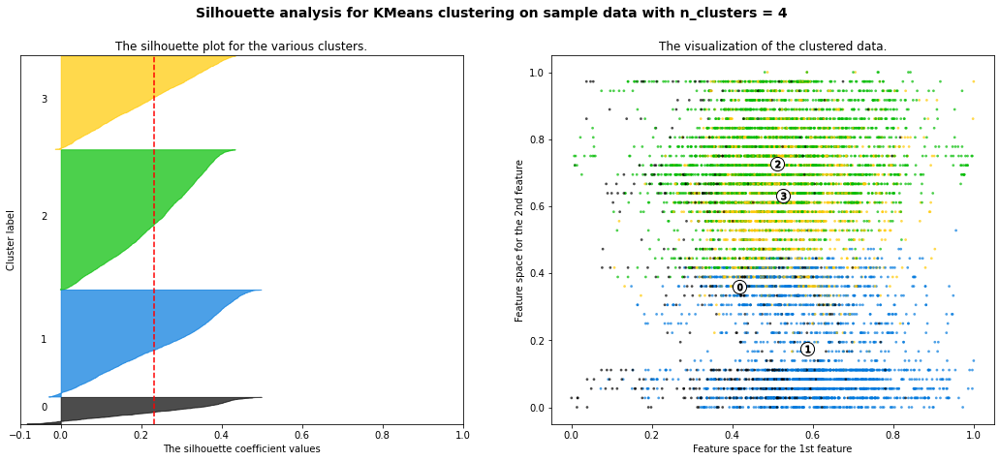

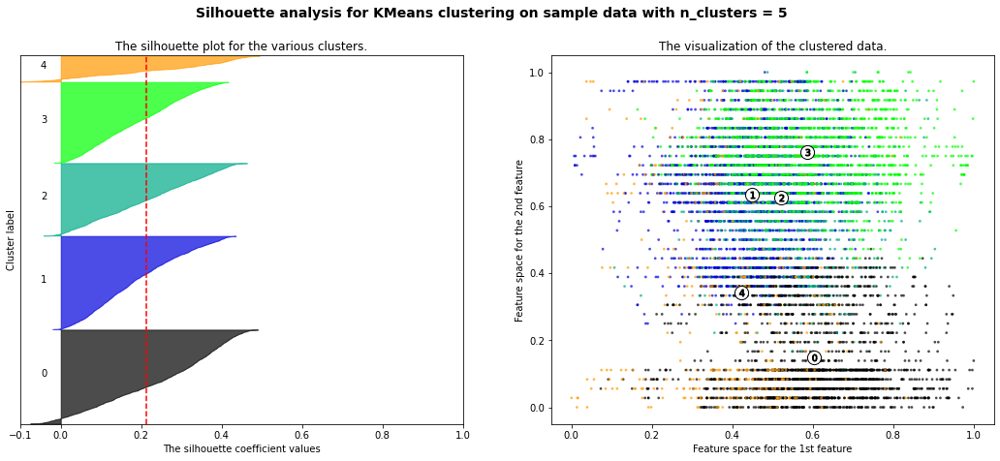

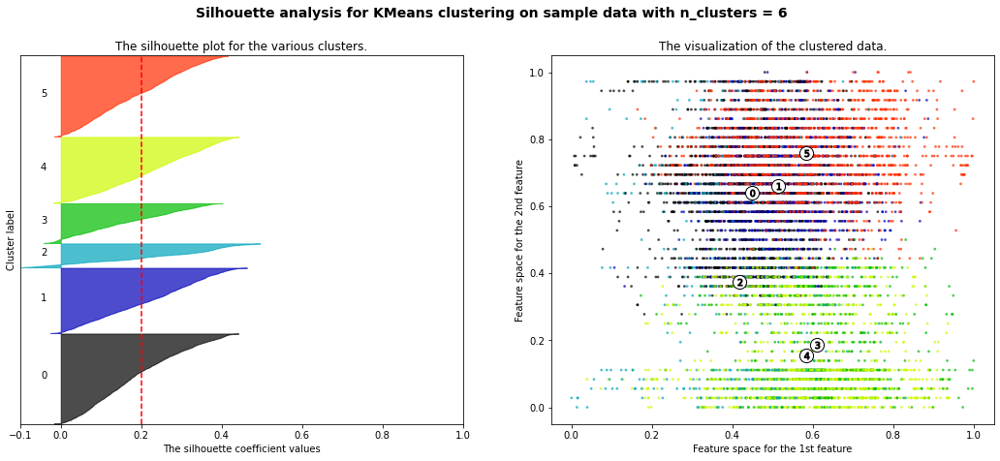

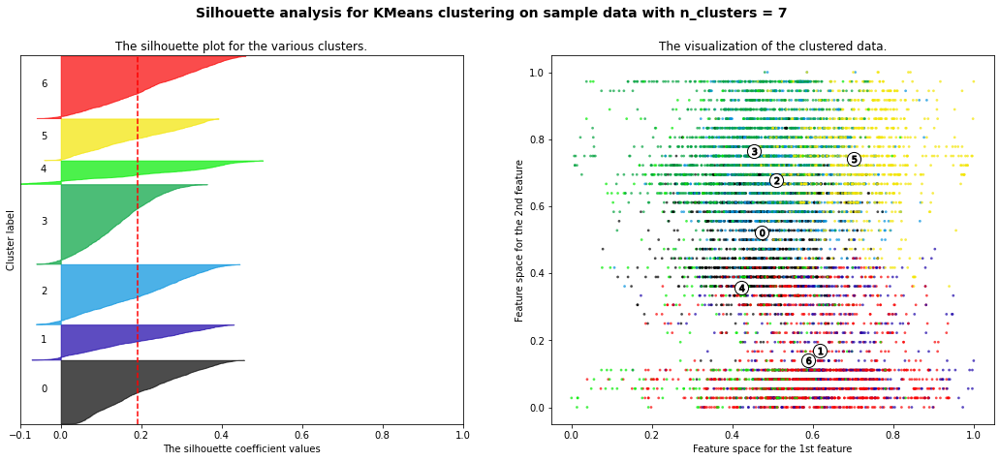

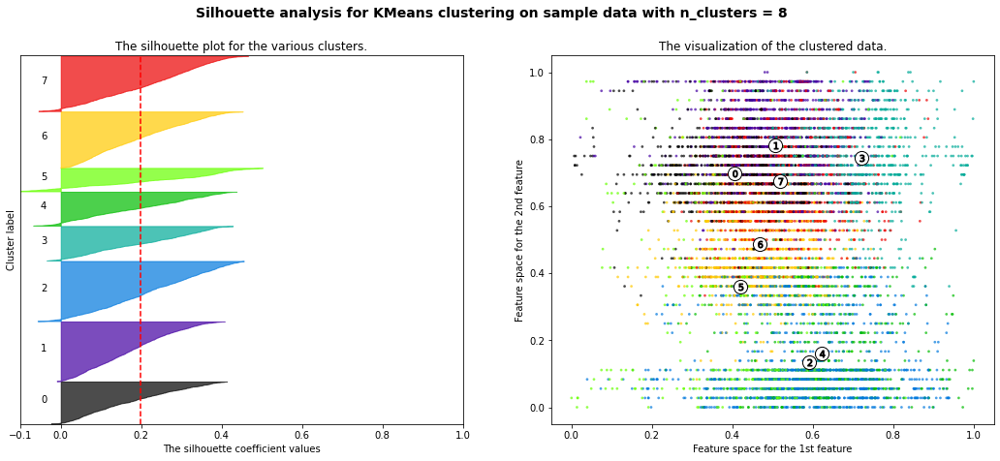

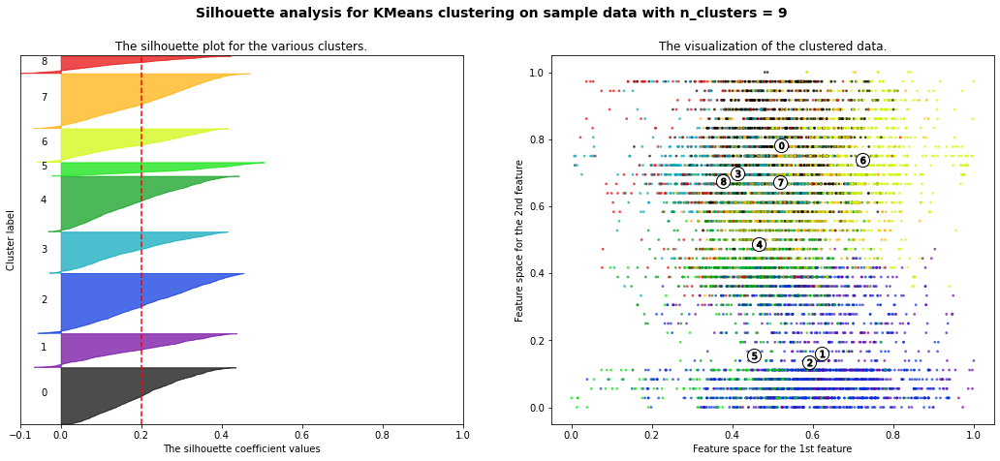

In [105]:
for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(Y) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(Y)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Y, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Y, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Y[:, 0], Y[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [106]:
scaler = MinMaxScaler()
w = scaler.fit_transform(df)
z = MinMaxScaler().fit_transform(df)

In [107]:
pca = PCA(n_components=7)
principalComponentw = pca.fit_transform(w)
principalComponentz = pca.fit_transform(z)

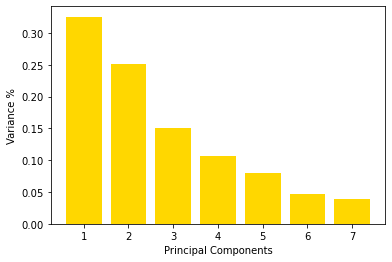

In [108]:
# Plotting the variances for each PC
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_componentsw = pd.DataFrame(principalComponentw)

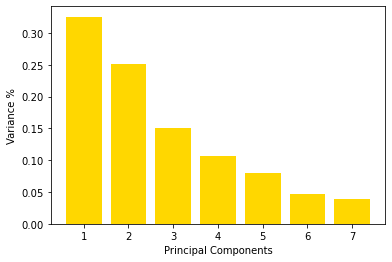

In [109]:
# Plotting the variances for each PC
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_componentsz = pd.DataFrame(principalComponentz)

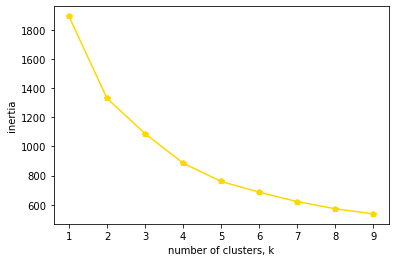

In [119]:
inertias = []

# Creating 10 K-Mean models while varying the number of clusters (k)
for k in range(1,10):
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_componentsw.iloc[:,:4])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
plt.plot(range(1,10), inertias, '-p', color='gold')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
#plt.xticks()
plt.show()

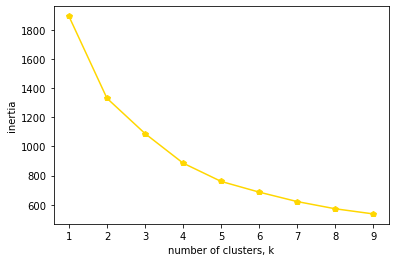

In [120]:
inertias = []

# Creating 10 K-Mean models while varying the number of clusters (k)
for k in range(1,10):
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_componentsz.iloc[:,:4])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
plt.plot(range(1,10), inertias, '-p', color='gold')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
#plt.xticks()
plt.show()

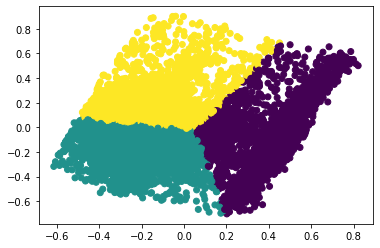

In [121]:
model = KMeans(n_clusters=3)
model.fit(PCA_componentsw.iloc[:,:5])

labelsw = model.predict(PCA_componentsw.iloc[:,:2])
plt.scatter(PCA_componentsw[0], PCA_componentsw[1], c=labelsw)
plt.show()

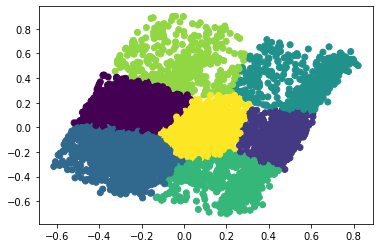

In [147]:
model = KMeans(n_clusters=7)
model.fit(PCA_componentsz.iloc[:,:2])

labelsz = model.predict(PCA_componentsz.iloc[:,:2])
plt.scatter(PCA_componentsz[0], PCA_componentsz[1], c=labelsz)
plt.show()

In [149]:
metrics.silhouette_score(PCA_componentsz.iloc[:,:2], labelsz)

0.4157449305289471

In [158]:
agg_compw = AgglomerativeClustering(linkage ='complete', n_clusters=5)
ascaledmm_compw = agg_compw.fit_predict(PCA_componentsw.iloc[:,:2])
labels_compw = agg_compw.labels_

agg_avgw = AgglomerativeClustering(linkage ='average', n_clusters=5)
ascaledmm_avgw = agg_avgw.fit_predict(PCA_componentsw.iloc[:,:2])
labelscaledmm_avgw = agg_avgw.labels_

agg_wardw = AgglomerativeClustering(linkage ='ward', n_clusters=5)
ascaledmm_wardw = agg_wardw.fit_predict(PCA_componentsw.iloc[:,:2])
labelscaledmm_wardw = agg_wardw.labels_

In [155]:
agg_compz = AgglomerativeClustering(linkage ='complete', n_clusters=5)
ascaledmm_compz = agg_compz.fit_predict(PCA_componentsz.iloc[:,:2])
labels_compz = agg_compz.labels_

agg_avgz = AgglomerativeClustering(linkage ='average', n_clusters=5)
ascaledmm_avgz = agg_avgz.fit_predict(PCA_componentsz.iloc[:,:2])
labelscaledmm_avgz = agg_avgz.labels_

agg_wardz = AgglomerativeClustering(linkage ='ward', n_clusters=5)
ascaledmm_wardz = agg_wardz.fit_predict(PCA_componentsz.iloc[:,:2])
labelscaledmm_wardz = agg_wardz.labels_

In [156]:
metrics.silhouette_score(PCA_componentsw.iloc[:,:2], labelsw), metrics.silhouette_score(PCA_componentsw.iloc[:,:2], labels_compw), metrics.silhouette_score(PCA_componentsw.iloc[:,:2], labelscaledmm_wardw), metrics.silhouette_score(PCA_componentsw.iloc[:,:2],labelscaledmm_avgw)  

(0.3782423755435361,
 0.2238857366868232,
 0.3293283329860948,
 0.40163262425695395)

In [157]:
metrics.silhouette_score(PCA_componentsz.iloc[:,:2], labelsz), metrics.silhouette_score(PCA_componentsz.iloc[:,:2], labels_compz), metrics.silhouette_score(PCA_componentsz.iloc[:,:2], labelscaledmm_wardz), metrics.silhouette_score(PCA_componentsz.iloc[:,:2],labelscaledmm_avgz)  

(0.4157449305289471,
 0.2238857366868232,
 0.3293283329860948,
 0.40163262425695395)